Copyright 2024 Google LLC.


In [ ]:
# @title Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
# https://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

## Run on Multiple Images

The notebook generates JSON summaries for each image in the dataset. To improve efficiency, parallel processing using threading is employed. This approach is particularly beneficial as the summary of each image is independent, allowing for simultaneous processing without exceeding output token limits.
For understanding the parallel processing refer this [link](https://docs.python.org/3/library/threading.html)

In [ ]:
!pip install -U -q google-generativeai

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 153.4/153.4 kB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 760.0/760.0 kB 17.5 MB/s eta 0:00:00


In [ ]:
#import the required libraries
import google.generativeai as genai
import json
from pprint import pprint
import os
from glob import glob
import threading
import queue
from PIL import Image

## Configure API Key

To run the following cell, your API key must be stored in a Colab Secret named GOOGLE_API_KEY. If you don't already have an API key, or you're not sure how to create a Colab Secret, see [Authentication](https://github.com/google-gemini/cookbook/blob/main/quickstarts/Authentication.ipynb) for an example.

In [ ]:
from google.colab import userdata
genai.configure(api_key=userdata.get("GOOGLE_API_KEY"))

## Download the data from



For this notebook we will download the data from [GCPSketchnote](https://github.com/priyankavergadia/GCPSketchnote/tree/main) Google Cloud Developer's Visual Notes

In [ ]:
! git clone https://github.com/priyankavergadia/GCPSketchnote.git

Cloning into 'GCPSketchnote'...
remote: Enumerating objects: 311, done.
remote: Counting objects: 100% (61/61), done.
remote: Compressing objects: 100% (54/54), done.
remote: Total 311 (delta 7), reused 45 (delta 7), pack-reused 250 (from 1)
Receiving objects: 100% (311/311), 117.09 MiB | 34.49 MiB/s, done.
Resolving deltas: 100% (104/104), done.


#### Reading the images from the folder

This code effectively filters a list of image paths, removing duplicates and excluding PDF files.

In [ ]:
image_paths = glob("/content/GCPSketchnote/images/*")

images = []
seen = set()
for image_path in image_paths:
  path, extension = os.path.splitext(image_path)
  if path not in seen and extension != ".pdf":
    images.append(image_path)
    seen.add(path)

### Display of a sample Image

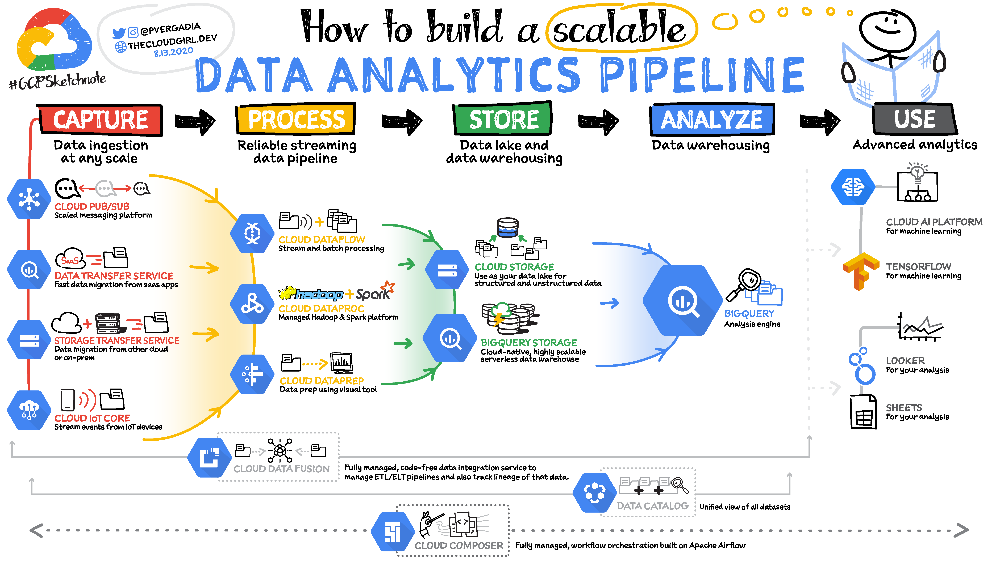

In [ ]:
display(Image.open(images[0]))

This function, convert_image, takes an image object and an optional resizing ratio as input.

In [ ]:
def convert_image(image : Image,ratio = 2):

  """ Converts the image to RGB mode, resizes it, and returns the resized image."""

  width, height = image.size
  return image.convert('RGB').resize((width//ratio, height//ratio))

The function generate_content_from_imgs() generates content using a generative model based on a prompt and a list of image paths.

In [ ]:
def generate_content_from_imgs(prompt : str ,images_paths : list):
  """
  Generates content from the given prompt and images.
  """
  model = genai.GenerativeModel('models/gemini-1.5-flash')
  response = model.generate_content(
    contents=[prompt] + [convert_image(Image.open(image_path)) for image_path in images_paths]+images_paths,
    generation_config={"response_mime_type": "application/json"},
    request_options={"timeout": 600}
    )
  return response

In [ ]:
def worker(prompt : str ,images : list,q):
  output = generate_content_from_imgs(prompt,images)
  q.put(output)
  q.task_done()


The QueueContextManager class is a simple context manager that provides a queue.Queue object to be used within a with statement. When the with block starts, the queue is made available, and when the block ends, the context is exited, but no additional cleanup or processing is done.

In [ ]:
class QueueContextManager:
  def __init__(self) -> None:
    self.q = queue.Queue()

  def __enter__(self):
    return self.q

  def __exit__(self, exc_type, exc_value, traceback):
    pass

## Parallel Processing of the Images

The code divides a list of images into chunks and processes them concurrently using multiple threads. Each thread runs a worker function that generates content based on a given prompt and a subset of the images, then places the results in a queue. After all threads have completed their work, the results are collected from the queue into a list called result_list. The use of a with statement ensures that the queue is properly managed within a context.

In [ ]:
n_threads = 5
prompt = '''Conduct a thorough analysis of each image provided in the list.
            Avoid relying on external data and refrain from repeating information.
            Extract the image name from the image_paths (e.g., from /content/GCPSketchnote/images/dataprep.jpg, extract "dataprep.jpg").
            Number the images sequentially.
            For each image, provide a comprehensive and informative explanation.'''


chunksize = len(images)//n_threads
threads = []
q = queue.Queue()

with QueueContextManager() as q:

  for i in range(n_threads):

    thread = threading.Thread(
                  target=worker,
                  args=(prompt,images[chunksize * i:chunksize * (i + 1)],q))
    threads.append(thread)
    thread.start()

  for thread in threads:
    thread.join()

  result_list = []
  while not q.empty():
    result_list.append(q.get())


The code below processes the results from result_list, converts them to JSON, and appends them to a single list called final_val

In [ ]:
final_list, final_val = [],[]
for result in result_list:
  json_response = json.loads(result.text)
  if 'images' in json_response:
    final_list.append(json_response['images'])
  else:
    final_list.append(json_response)


for i in range(len(final_list)):
  for j in range(len(final_list[i])):
    final_val.append(final_list[i][j])

Displaying a sample of 5 images alongside their corresponding descriptions.

("This image presents a visual representation of Google Cloud's Network "
 'Intelligence Center (NIC). NIC is a platform for network monitoring, '
 'verification, and optimization. The image highlights the various aspects of '
 'NIC, including performance dashboard, connectivity tests, topology overview, '
 'firewall insights, and network topology.')


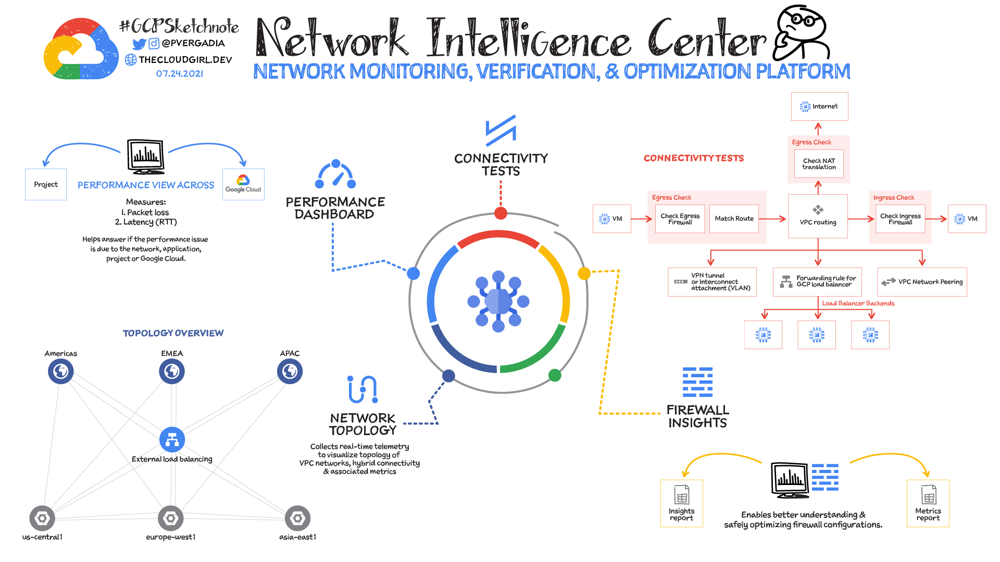

('This infographic showcases the capabilities of Datastream, a Google Cloud '
 'service designed for moving data from various sources to Google Cloud '
 "destinations. It outlines Datastream's key features, including its "
 'serverless architecture, ease of setup, secure connectivity, and unmatched '
 'flexibility. The infographic also details different datastream use cases '
 'such as Datastream for analytics, Datastream for DB replication, Datastream '
 'for event-driven architectures and connectivity options like private '
 'connectivity (vPC peering), port forwarding, and allow-list.')


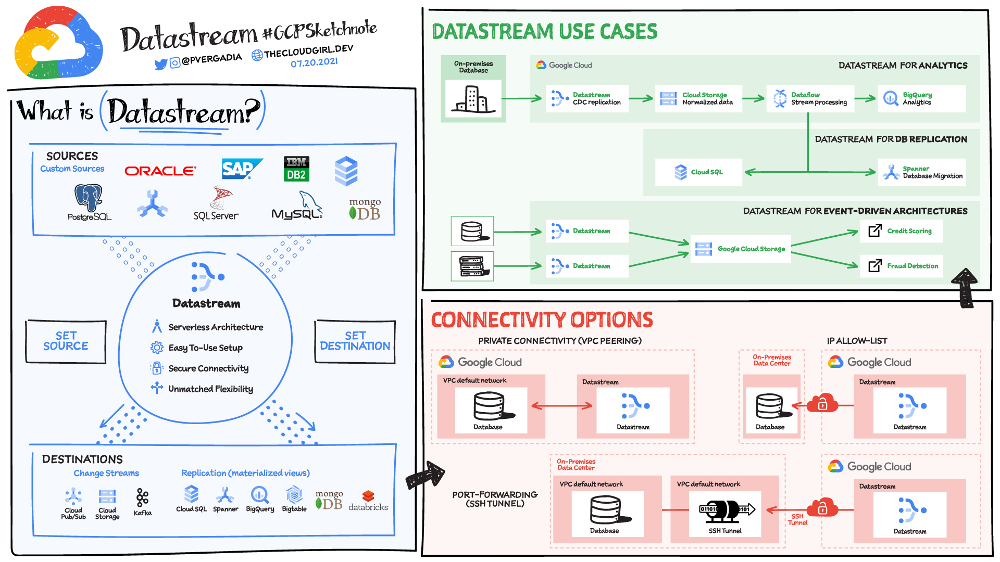

('The image focuses on Vertex Forecast, a service within Google Cloud that '
 'enables users to build and deploy high-quality forecasting solutions. It '
 'details the four steps of Vertex Forecast, including data preparation, model '
 'training, forecasting, and integration. The image emphasizes Vertex '
 "Forecast's ability to automatically perform various tasks like feature "
 'engineering, model selection, and ensemble creation. It also showcases the '
 'use of BigQuery ML for statistical modeling and AutoML for automating tasks '
 'like seasonal and trend decomposition, holiday effects adjustment, and style '
 '& anomaly identification.')


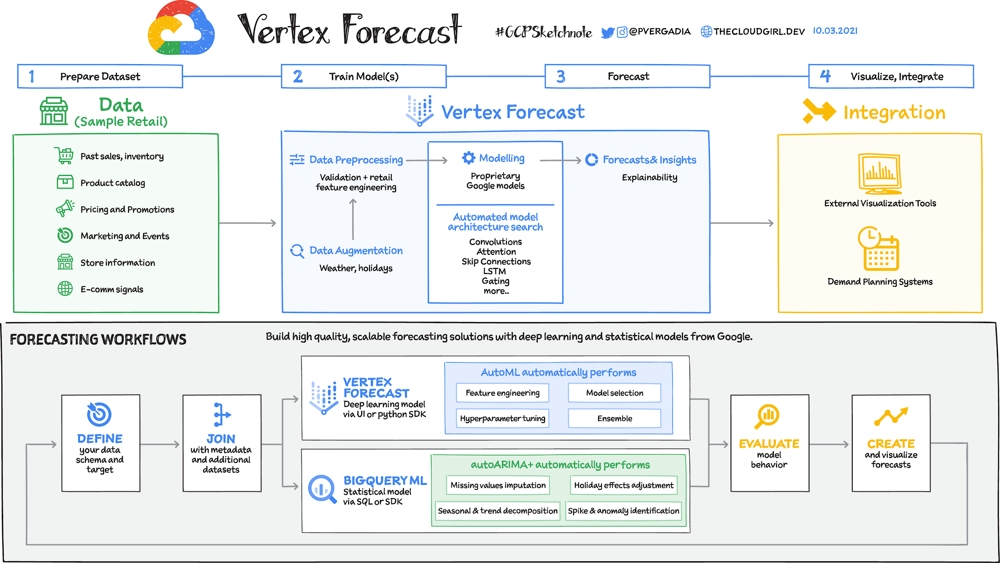

('This image provides a visual representation of the migration journey with '
 'Google Cloud. It illustrates various options for migrating applications to '
 'Google Cloud, ranging from lift and shift to containerization and serverless '
 'approaches. The image guides users to consider factors such as the '
 'application stack, the level of modernization needed, and the amount of '
 'change involved in choosing the appropriate migration strategy.')


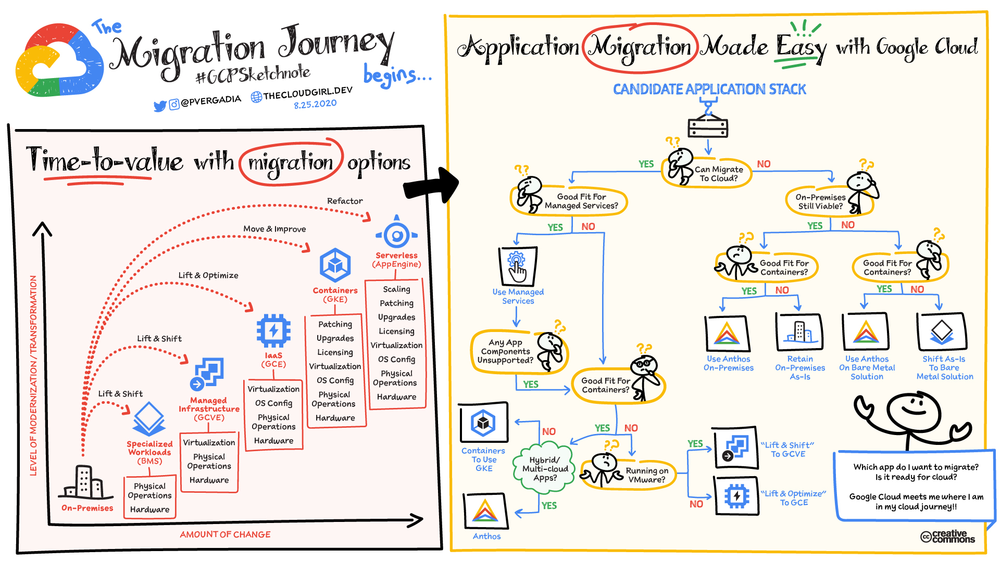

('This image introduces the concept of cloud security within the Google Cloud '
 'ecosystem. It depicts various layers of security considerations, including '
 'shared fate (customer and cloud provider responsibilities), identity & '
 'access management, endpoint security, data security, secure software supply '
 'chain, application security, networking security, infrastructure security, '
 'and security monitoring & operations. The image highlights how Google Cloud '
 'provides a robust security framework across different aspects of cloud '
 'infrastructure and applications.')


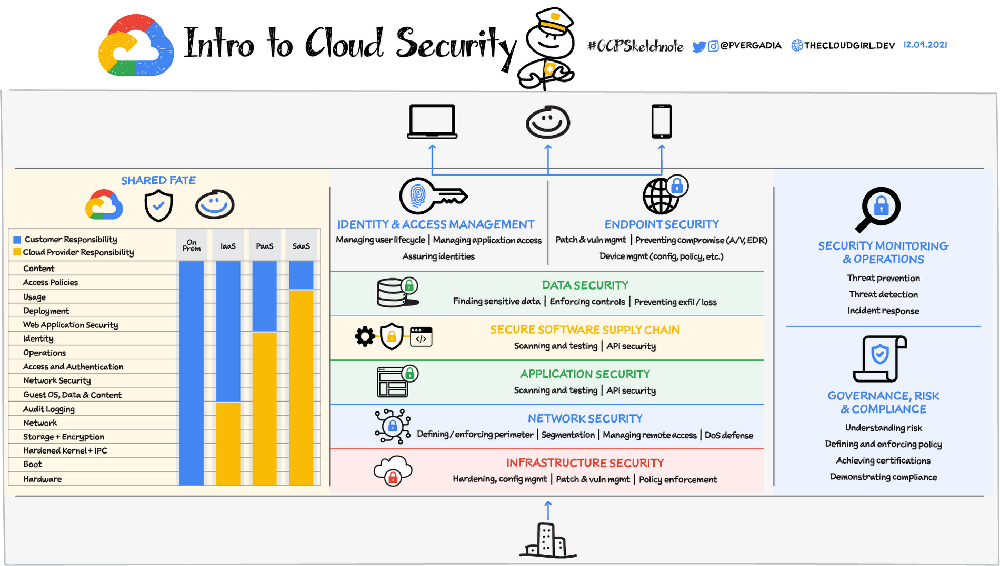

In [ ]:
for val in final_val[:5]:
  pprint(val['explanation'])
  img_path = "/content/GCPSketchnote/images/"+val['image_name']
  display(Image.open(img_path))